**Section 6: Structural Equation Modelling**


**Tarea 4**
**Integrantes:**

* Francisca Carolina Jara Yévenes 
* Luis Fernando Retamal Fuentes

**Fecha:** 6 de diciembre de 2022

**Bibliotecas requeridas**

In [ ]:
%pip install linearmodels
%pip install semopy
%pip install factor_analyzer
import numpy as np
import pandas as  pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import statsmodels.formula.api as smf
import sklearn
import scipy 
import matplotlib.pyplot as plt
from scipy.linalg import eigh, cholesky
from scipy.stats import norm
import linearmodels.panel as lmp
from pylab import plot, show, axis, subplot, xlabel, ylabel, grid
import semopy 
import seaborn as sns
from factor_analyzer import FactorAnalyzer
from sklearn.decomposition import PCA
import seaborn as sns
%matplotlib inline
%pip install graphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.5 MB 4.8 MB/s 
     |████████████████████████████████| 68 kB 2.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 5.8 MB/s 
  Created wheel for semopy: filename=semopy-2.3.9-py3-none-any.whl size=1657804 sha256=a68c578e43ab0473689c50a448b70b8269ee467528f8314ca90d3e36e81ab9ed
  Stored in directory: /root/.cache/pip/wheels/aa/d5/83/afbfa4fe06d08c0ec7849e93aa71843aa514684b3f22e3a694
  Created wheel for sklearn: filename=sklearn-0.0.post1-py3-none-any.whl size=2344 sha256=0b3295239d69b30fe3154d62c9e06ae40780c17db960bfdabf82a269360d85a2
  Stored in directory: /root/.cache/pip/wheels/14/25/f7/1cc0956978ae479e75140219088deb7a36f60459df242b1a72
Successfully built semopy sklearn
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-

**Pregunta 1**
Cargue la base de datos y realice los ajustes necesarios para su uso (missing values, recodificar variables, etcetera). Identifique los tipos de datos que se encuentran en la base, realice estadisticas descriptivas sobre las variables importantes (Hint: Revisar la distribuciones, datos faltantes, outliers, etc.) y limpie las variables cuando sea necesario.

In [ ]:
junaeb2 = pd.read_csv('junaeb2.csv') 
junaeb2.dropna(inplace=True) ##remueve faltantes
junaeb2.reset_index(drop=True, inplace=True) ##resetea indices
junaeb2.describe() ##muestra principales estadisticas

,sexo,edad,imce,vive_padre,vive_madre,sk1,sk2,sk3,sk4,sk5,...,sk9,sk10,sk11,sk12,sk13,act_fisica,area,educm,educp,madre_work
count,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000,...,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000,57357.000000
mean,0.535349,81.880032,1.018703,0.721464,0.976481,1.106439,1.385550,1.253500,1.246823,1.263699,...,1.322576,1.845651,1.376972,1.489304,1.683474,2.559461,0.907213,13.084175,12.988807,0.102498
std,0.498753,3.767887,1.367474,0.449137,0.161354,0.375685,0.646275,0.572033,0.562731,0.558155,...,0.651805,0.933007,0.658345,0.786647,0.977397,1.070257,0.290137,3.321205,3.420867,0.941063
min,0.000000,62.000000,-5.020000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,-1.000000
25%,0.000000,80.000000,0.110000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,12.000000,11.000000,-1.000000
50%,1.000000,81.000000,0.980000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,2.000000,1.000000,1.000000,1.000000,2.000000,1.000000,13.000000,13.000000,0.000000
75%,1.000000,83.000000,1.930000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,...,1.000000,2.000000,2.000000,2.000000,2.000000,3.000000,1.000000,15.000000,14.000000,1.000000
max,1.000000,107.000000,5.040000,2.000000,2.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.000000,22.000000,22.000000,1.000000


Se analizan las variables con datos que no corresponden por ejemplo la variable binaria vive_padre. Según la información dada hay datos donde vive_padre=2 por lo tanto se eliminan dichos datos.


In [ ]:
junaeb2 = junaeb2.drop(junaeb2[junaeb2['vive_padre']==2].index)
junaeb2 = junaeb2.drop(junaeb2[junaeb2['vive_madre']==2].index)

***Datatypes***
Se identifican los principales tipos de datos presentes en la  base de datos. 


In [ ]:
junaeb2.dtypes 

sexo            int64
edad            int64
imce          float64
vive_padre      int64
vive_madre      int64
sk1             int64
sk2             int64
sk3             int64
sk4             int64
sk5             int64
sk6             int64
sk7             int64
sk8             int64
sk9             int64
sk10            int64
sk11            int64
sk12            int64
sk13            int64
act_fisica    float64
area            int64
educm         float64
educp           int64
madre_work      int64
dtype: object

**Outliers**

Text(0.5, 1.0, 'Análisis outliers dataframe')

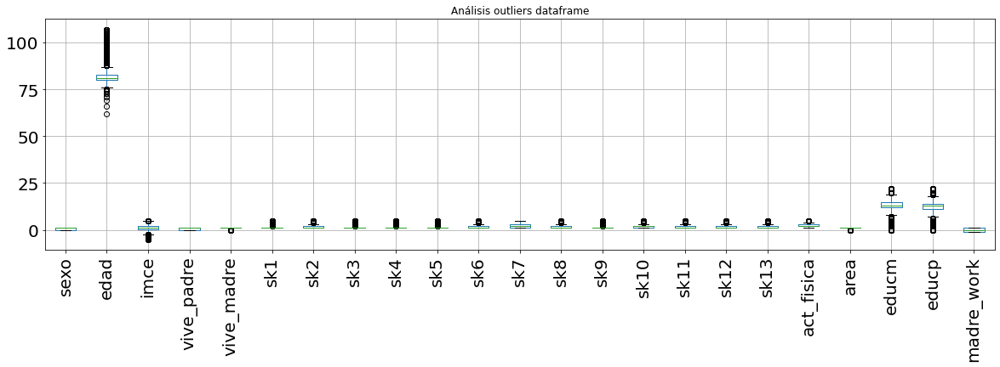

In [ ]:
boxplot = junaeb2.boxplot(grid=True,rot=90, fontsize=20,figsize =(20, 5))
plt.title('Análisis outliers dataframe')

Se analizan los puntos atípicos en el anexo 2, para cada una de las variables. Y se eliminan del dataframe.

In [ ]:
junaeb2 = junaeb2.drop(junaeb2[junaeb2['edad']<77].index)
junaeb2 = junaeb2.drop(junaeb2[junaeb2['imce']<-3.4].index)
junaeb2 = junaeb2.drop(junaeb2[junaeb2['educp']<2].index)
junaeb2 = junaeb2.drop(junaeb2[junaeb2['educm']<2].index)

**Pregunta 2**
Usando las variables sk1-sk13 realice un PCA. En particular, identifique los valores propios y determine el numero optimo de componentes. Luego estime y grafique la distribucion de los componentes. Ademas discuta la importancia relativa de las variables sobre cada uno de los componentes estimados. Que se puede concluir de este analisis?

En primer lugar se crea una copia del dataframe original para poder realizar las modificaciones necesarias. Posteriormente se mantienen solo las variables que seran utilizadas para el análisis de componentes principales. 


In [ ]:
junaeb=junaeb2
junaeb=junaeb.drop(['sexo','edad','imce','vive_padre','vive_madre','act_fisica','area','educm','educp','madre_work'], axis=1)

In [ ]:
junaeb3=junaeb

In [ ]:
junaeb4=junaeb2

**Matriz de covarianzas**

In [ ]:
cov_mat = junaeb.cov()

In [ ]:
evals, evecs = eigh(cov_mat)
print(evals)

[0.09431962 0.15725569 0.18658041 0.22026655 0.24292338 0.32829119
 0.38883165 0.4792948  0.49798753 0.59555034 0.75011716 1.40884446
 2.1387159 ]


**Número de componentes**

In [ ]:
pca = PCA(n_components='mle')
pca_features = pca.fit_transform(junaeb)
print(pca.explained_variance_ratio_)

[0.28558178 0.18812238 0.10016281 0.07952357 0.06649605 0.06400002
 0.05192052 0.04383658 0.03243745 0.02941209 0.024914   0.02099828]


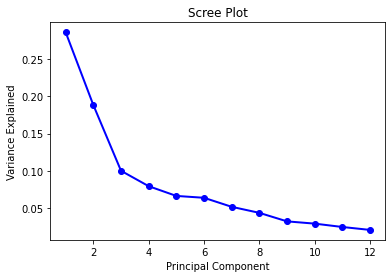

In [ ]:
#scree plot using explained variance proportion

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [ ]:
pca_vectors = pd.DataFrame(data = pca.components_)
pca_vectors.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.103114,0.228291,0.168511,0.184532,0.185546,0.252601,0.345430,0.293430,0.239209,0.405149,0.286881,0.292054,0.426828
1,0.007136,0.031170,0.062702,0.053515,0.039694,-0.030137,-0.925045,0.100524,0.085439,0.166887,0.101584,0.153978,0.233893
2,0.083152,0.266199,0.183683,0.190855,0.297749,0.334707,-0.115595,0.478245,0.077155,-0.390723,0.000451,-0.087625,-0.492950
3,0.001087,-0.024209,-0.033307,-0.027283,-0.042926,0.004597,-0.035205,-0.095019,0.102984,0.697987,0.144889,0.018434,-0.682864
4,0.150304,0.293709,0.313977,0.306309,-0.013573,0.184262,-0.039079,-0.757964,0.084334,-0.175872,0.085949,0.194917,-0.071698


In [ ]:
pca_df = pd.DataFrame(data=pca_features,columns=['PC1', 'PC2', 'PC3','PC4', 'PC5', 'PC6','PC7', 'PC8', 'PC9','PC10', 'PC11', 'PC12'])
pca_df.describe().apply(lambda s: s.apply('{0:.3f}'.format))

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
count,56857.000,56857.000,56857.000,56857.000,56857.000,56857.000,56857.000,56857.000,56857.000,56857.000,56857.000,56857.000
mean,-0.000,0.000,0.000,0.000,-0.000,-0.000,-0.000,0.000,-0.000,0.000,-0.000,0.000
std,1.462,1.187,0.866,0.772,0.706,0.692,0.624,0.573,0.493,0.469,0.432,0.397
min,-1.903,-3.217,-4.112,-3.460,-3.813,-3.917,-4.586,-4.370,-4.210,-3.560,-2.440,-3.102
25%,-1.095,-0.720,-0.469,-0.243,-0.286,-0.396,-0.313,-0.289,-0.213,-0.191,-0.217,-0.054
50%,-0.267,0.191,0.005,-0.091,0.098,0.033,0.062,0.027,-0.018,0.039,0.049,0.019
75%,0.787,0.814,0.455,0.516,0.332,0.272,0.309,0.193,0.207,0.117,0.113,0.040
max,10.909,4.629,5.755,3.692,5.174,4.565,4.708,5.221,4.459,3.789,3.832,3.272


In [ ]:
pca_df.corr().apply(lambda s: s.apply('{0:.3f}'.format))

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
PC1,1.000,0.000,0.000,0.000,-0.000,0.000,-0.000,0.000,-0.000,0.000,0.000,-0.000
PC2,0.000,1.000,-0.000,0.000,-0.000,0.000,-0.000,-0.000,0.000,-0.000,-0.000,0.000
PC3,0.000,-0.000,1.000,-0.000,0.000,-0.000,0.000,0.000,0.000,0.000,0.000,0.000
PC4,0.000,0.000,-0.000,1.000,-0.000,-0.000,0.000,-0.000,0.000,0.000,-0.000,0.000
PC5,-0.000,-0.000,0.000,-0.000,1.000,-0.000,-0.000,0.000,-0.000,-0.000,-0.000,0.000
PC6,0.000,0.000,-0.000,-0.000,-0.000,1.000,-0.000,-0.000,0.000,-0.000,-0.000,-0.000
PC7,-0.000,-0.000,0.000,0.000,-0.000,-0.000,1.000,0.000,-0.000,-0.000,-0.000,0.000
PC8,0.000,-0.000,0.000,-0.000,0.000,-0.000,0.000,1.000,0.000,-0.000,0.000,0.000
PC9,-0.000,0.000,0.000,0.000,-0.000,0.000,-0.000,0.000,1.000,0.000,0.000,0.000
PC10,0.000,-0.000,0.000,0.000,-0.000,-0.000,-0.000,-0.000,0.000,1.000,0.000,-0.000


**Pregunta 3**
Con los resultados de la Pregunta 2, mantenga los primeros 3 componentes principales. Graficamente indique si existen diferencias significativas entre grupos usando las siguientes variables: sexo, area, madre_work y act_fisica. Que puede concluir de los resultados?


In [ ]:
pca = PCA(n_components=3)
pca_features = pca.fit_transform(junaeb)
print(pca.explained_variance_ratio_)

[0.28558178 0.18812238 0.10016281]


In [ ]:
pca_vectors = pd.DataFrame(data = pca.components_)
pca_vectors.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.103114,0.228291,0.168511,0.184532,0.185546,0.252601,0.345430,0.293430,0.239209,0.405149,0.286881,0.292054,0.426828
1,0.007136,0.031170,0.062702,0.053515,0.039694,-0.030137,-0.925045,0.100524,0.085439,0.166887,0.101584,0.153978,0.233893
2,0.083152,0.266199,0.183683,0.190855,0.297749,0.334707,-0.115595,0.478245,0.077155,-0.390723,0.000451,-0.087625,-0.492950


In [ ]:
pca_df = pd.DataFrame(data=pca_features,columns=['PC1', 'PC2', 'PC3'])
pca_df.describe().apply(lambda s: s.apply('{0:.3f}'.format))

,PC1,PC2,PC3
count,56857.000,56857.000,56857.000
mean,-0.000,0.000,-0.000
std,1.462,1.187,0.866
min,-1.903,-3.217,-4.112
25%,-1.095,-0.720,-0.469
50%,-0.267,0.191,0.005
75%,0.787,0.814,0.455
max,10.909,4.629,5.755


In [ ]:
pca_df.corr().apply(lambda s: s.apply('{0:.3f}'.format))


,PC1,PC2,PC3
PC1,1.000,-0.000,0.000
PC2,-0.000,1.000,0.000
PC3,0.000,0.000,1.000


/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


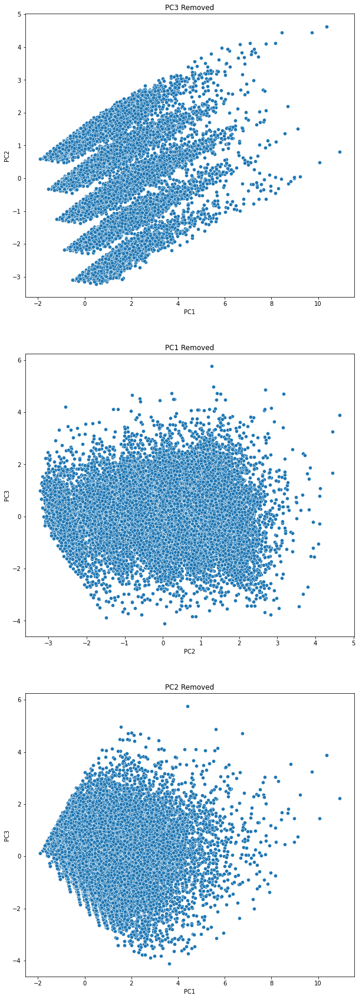

In [ ]:
#scatterplot for PC1, PC2, PC3

figure, axes = plt.subplots(3, sharex=False, figsize=(10,30))

axes[0].set_title('PC3 Removed')
axes[1].set_title('PC1 Removed')
axes[2].set_title('PC2 Removed')

sns.scatterplot('PC1', 'PC2', ax=axes[0], data=pca_df)
sns.scatterplot('PC2', 'PC3', ax=axes[1], data=pca_df)
sns.scatterplot('PC1', 'PC3', ax=axes[2], data=pca_df)

PC1 tiende a ser positivo. PC2 y PC3 parecieran distribuirse similarmente con respecto al origen.

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


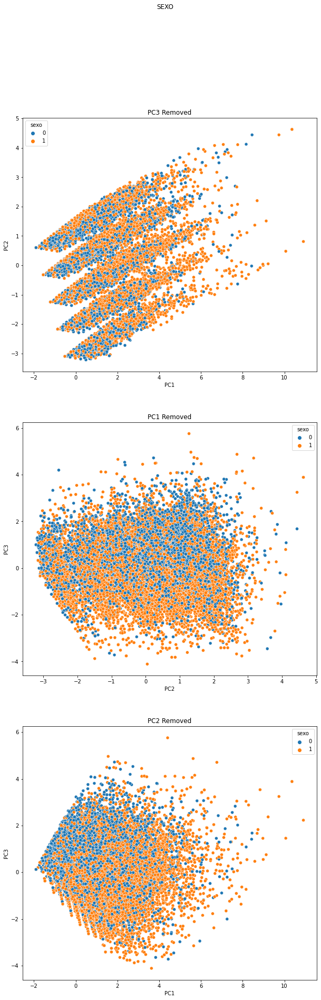

In [ ]:
#scatterplot for PC1, PC2, PC3 against binary partition of sexo

figure, axes = plt.subplots(3, sharex=False, figsize=(10, 30))
figure.suptitle('SEXO')

pca_df['sexo'] = 0
pca_df['sexo'] = np.where(junaeb2['sexo'] > 0, 1, pca_df['sexo'])

axes[0].set_title('PC3 Removed')
axes[1].set_title('PC1 Removed')
axes[2].set_title('PC2 Removed')

sns.scatterplot('PC1', 'PC2', ax=axes[0], data=pca_df, hue='sexo')
sns.scatterplot('PC2', 'PC3', ax=axes[1], data=pca_df, hue='sexo')
sns.scatterplot('PC1', 'PC3', ax=axes[2], data=pca_df, hue='sexo')

Se observa que no hay claridad en la formación de clusters.

Entre los componentes PC1 y PC3, se puede interpretar que si sexo = 1, PC3 suele ser negativo y PC1 positivo. En cambio, si sexo = 0, PC3 es positivo, al igual que PC1. Una situación similiar se observa cuando se evalúan los componentes PC2 y PC3. Si sexo = 0, PC3 toma un valor positivo. En caso contrario, PC3 toma un valor negativo. Se concluye que, a pesar de no ser clusters perfectamente definidos, el PC3 pareciera explicar la variación de la variable sexo.

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


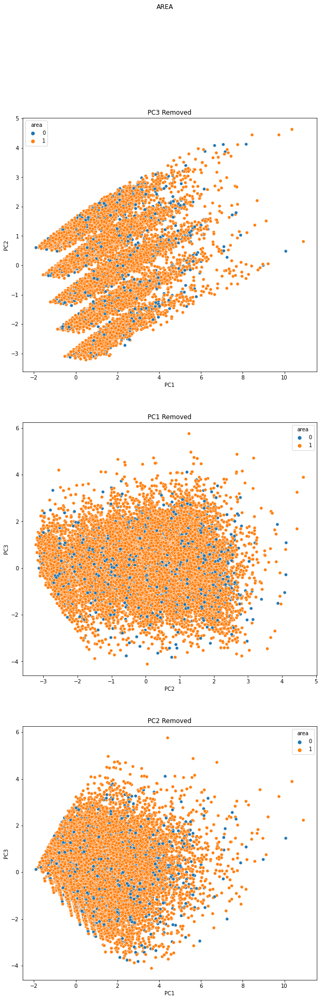

In [ ]:
#scatterplot for PC1, PC2, PC3 against binary partition of area

figure, axes = plt.subplots(3, sharex=False, figsize=(10, 30))
figure.suptitle('AREA')

pca_df['area'] = 0
pca_df['area'] = np.where(junaeb2['area'] > 0, 1, pca_df['area'])

axes[0].set_title('PC3 Removed')
axes[1].set_title('PC1 Removed')
axes[2].set_title('PC2 Removed')

sns.scatterplot('PC1', 'PC2', ax=axes[0], data=pca_df, hue='area')
sns.scatterplot('PC2', 'PC3', ax=axes[1], data=pca_df, hue='area')
sns.scatterplot('PC1', 'PC3', ax=axes[2], data=pca_df, hue='area')

La diferencia entre los valores de las observaciones, es decir, entre los area = 1 y area = 0, dificulta la interpretación de la relación entre los componentes. Esto debido a que hay una mayor cantidad de datos con el valor 1, por lo que pareciera ser un cluster. Los pocos datos con el valor 0 parecen estar sueltos en comparación. 

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


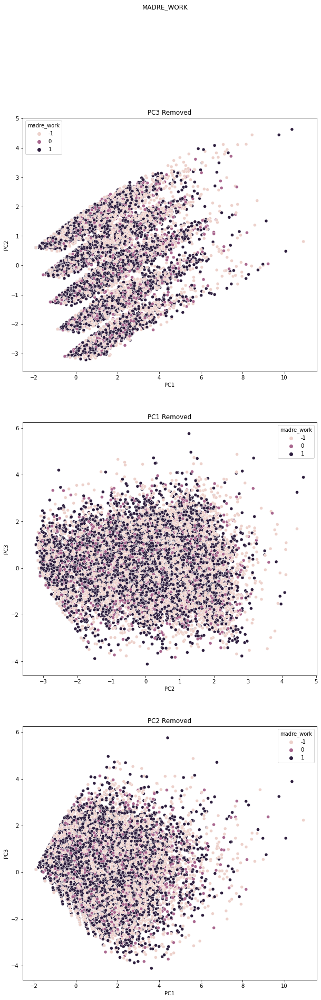

In [ ]:
#scatterplot for PC1, PC2, PC3 against binary partition of madre_work

figure, axes = plt.subplots(3, sharex=False, figsize=(10,30))
figure.suptitle('MADRE_WORK')

pca_df['madre_work'] = 0
pca_df['madre_work'] = np.where(junaeb2['madre_work'] == -1, -1, pca_df['madre_work'])
pca_df['madre_work'] = np.where(junaeb2['madre_work'] == 1, 1, pca_df['madre_work'])

axes[0].set_title('PC3 Removed')
axes[1].set_title('PC1 Removed')
axes[2].set_title('PC2 Removed')

sns.scatterplot('PC1', 'PC2', ax=axes[0], data=pca_df, hue='madre_work')
sns.scatterplot('PC2', 'PC3', ax=axes[1], data=pca_df, hue='madre_work')
sns.scatterplot('PC1', 'PC3', ax=axes[2], data=pca_df, hue='madre_work')

No existe una clasificación. No se observa separación de grupos. Se concluye que ninguno de estos componentes explica la variable madre_work.

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


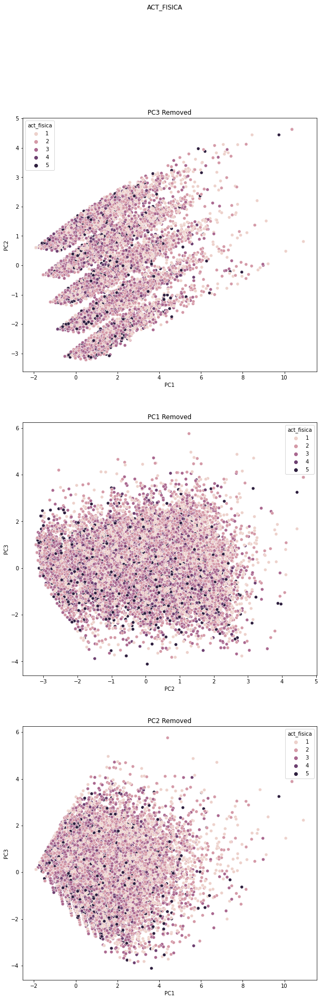

In [ ]:
#scatterplot for PC1, PC2, PC3 against discrete partition of act_fisica

figure, axes = plt.subplots(3, sharex=False, figsize=(10, 30))
figure.suptitle('ACT_FISICA')

pca_df['act_fisica'] = 0
pca_df['act_fisica'] = np.where(junaeb2['act_fisica'] == 1, 1, pca_df['act_fisica'])
pca_df['act_fisica'] = np.where(junaeb2['act_fisica'] == 2, 2, pca_df['act_fisica'])
pca_df['act_fisica'] = np.where(junaeb2['act_fisica'] == 3, 3, pca_df['act_fisica'])
pca_df['act_fisica'] = np.where(junaeb2['act_fisica'] == 4, 4, pca_df['act_fisica'])
pca_df['act_fisica'] = np.where(junaeb2['act_fisica'] == 5, 5, pca_df['act_fisica'])

axes[0].set_title('PC3 Removed')
axes[1].set_title('PC1 Removed')
axes[2].set_title('PC2 Removed')

sns.scatterplot('PC1', 'PC2', ax=axes[0], data=pca_df, hue='act_fisica')
sns.scatterplot('PC2', 'PC3', ax=axes[1], data=pca_df, hue='act_fisica')
sns.scatterplot('PC1', 'PC3', ax=axes[2], data=pca_df, hue='act_fisica')

Situación similar a la varible madre_work. No hay una clara separación de grupos, por lo que no se puede hacer una interpretación. Ninguno de los componentes explica la variable act_fisica.

Como los componentes principales PC1, PC2 y PC3 fueron calculados sin la presencia de las variables sexo, area, madre_work y act_fisica, la relación de los componentes no explica con claridad visual la variación de estas. Si se utilizara alguna de las variables sk1-13, con las que se determinaron los componentes, los gráficos mostrarían con mayor claridad los clusters para cada valor.

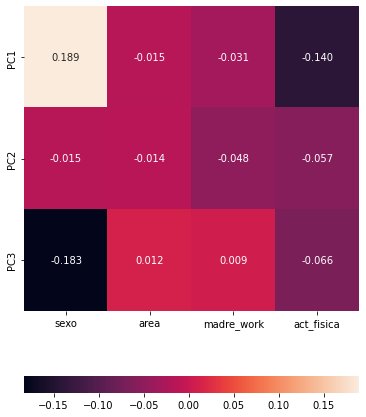

In [ ]:
pca_df1=pca_df.corr()
pca_df1=pca_df1.drop(['PC1', 'PC2', 'PC3'], axis=1)
pca_df1=pca_df1.drop(['sexo', 'area', 'madre_work', 'act_fisica'], axis=0)

plt.figure(figsize=(6,8))
sns.heatmap(pca_df1, annot = True, fmt='.3f', cbar_kws={"orientation":"horizontal"})

El heatmap muestra la correlación entre las variables sexo, area, madre_work y act_fisica, con los componentes PC1, PC2 y PC3. Como se puede observar, la correlación entre las variables y los componentes es bastante baja. La correlación más alta es entre la variable sexo con los componentes PC1 (positva) y PC3 (negativa). Con este heatmap se confirma la interpretación de los gráficos de puntos.

**Pregunta 4**
A partir del mismo set de variables sk1-sk13 realice un EFA. En particular determine el numero optimo de factores y las variables que se asocian a cada factor. Tambien discuta si existen variables que no son informativas (Hint: para realizar un EFA, todas las variables deben estar representatadas en el mismo sentido logico. Si una carateristica es negativa debe ser invertida en la escala, de tal forma que todas las variables representen aspectos positivos).


Dado que todas las  variables deben estar representatadas en el mismo sentido lógico, se analizan las 13 variables involucradas. En este caso la variable sk7 tiene una connotación negativa repecto al resto de variables por lo que se invierte su valor y es re definida como:

sk7: No es agresivo (1: siempre - 5: nunca). 




In [ ]:
junaeb3.reset_index(drop=True, inplace=True)

In [ ]:
largo=junaeb3.sk1.count()
list1=[]
for i in range(largo):
  if (junaeb3.sk7[i]==5):
    list1.append(1)
  elif (junaeb3.sk7[i]==4):
    list1.append(2)
  elif (junaeb3.sk7[i]==3):
    list1.append(3)
  elif (junaeb3.sk7[i]==2):
    list1.append(4)
  elif (junaeb3.sk7[i]==1):
    list1.append(5)
junaeb3=junaeb3.drop(columns=['sk7'])
junaeb3.insert(6,"sk7",list1,False)


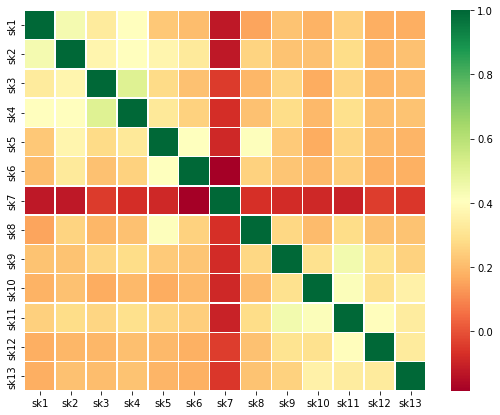

In [ ]:
fig, ax = plt.subplots(figsize=(9,7))
sns.heatmap(junaeb3.corr(), cmap='RdYlGn',linewidth=.5,annot_kws={'size': 30})

Dado que no se produjo el cambio necesario en la variable sk7 respecto al resto de variables, y sigue teniendo una correlacion en un sentido contrario, entonces es excluida de la data. 

In [ ]:
junaeb3=junaeb3.drop(['sk7'], axis=1)

In [ ]:
junaeb3.head(3)

,sk1,sk2,sk3,sk4,sk5,sk6,sk8,sk9,sk10,sk11,sk12,sk13
0,1,1,1,1,1,1,1,1,1,1,1,1
1,1,1,1,1,1,1,1,1,1,1,1,1
2,1,1,1,2,2,2,2,3,3,3,2,2


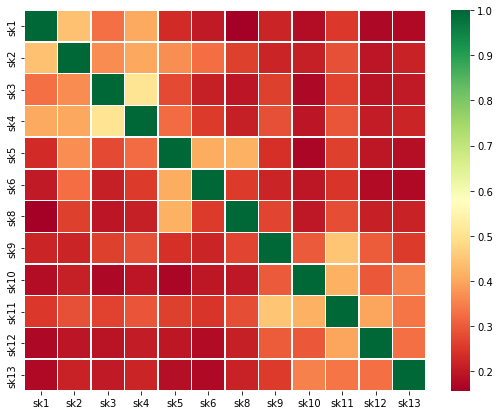

In [ ]:
fig, ax = plt.subplots(figsize=(9,7))
sns.heatmap(junaeb3.corr(), cmap='RdYlGn',linewidth=.5,annot_kws={'size': 30}) 

Se utiliza el análisis factorial incluyendo una rotación promax, para determinar la variable que pertenece a cada uno de los factores. 

In [ ]:
fa = FactorAnalyzer(rotation='promax')
fa.fit(junaeb3)

FactorAnalyzer(rotation_kwargs={})

Se procede a determinar la carga factorial para cada una de las variables.

In [ ]:
fa.loadings_

array([[ 1.71190755e-02,  6.09036608e-01, -4.92604238e-02],
       [-2.39684004e-02,  5.15607493e-01,  2.00349173e-01],
       [ 1.90795172e-02,  6.41512599e-01, -3.34829721e-02],
       [ 4.61240517e-04,  7.33821478e-01, -2.63591229e-02],
       [-1.60568272e-01, -1.14854342e-02,  9.00443009e-01],
       [ 3.42486634e-02,  8.30212678e-02,  4.48174244e-01],
       [ 1.61091204e-01, -7.73518293e-02,  4.83330557e-01],
       [ 4.87977896e-01,  8.27723571e-02,  4.35928634e-02],
       [ 6.22881817e-01, -3.41077996e-02, -4.16988964e-02],
       [ 6.98808354e-01,  2.97967371e-02,  4.56304122e-04],
       [ 5.67475441e-01, -2.55404549e-02, -3.49514811e-04],
       [ 5.25622343e-01,  1.88995601e-02, -1.11508448e-02]])

De este análisis se determina que variable informa a cada factor.  En este caso el número de factores necesarios es determinado de forma óptima, debido a la utilización de la rotacion promax que permite que los factores estén correlacionados y un mayor grado de significancia. 

Por lo tanto según este análisis de determina que el caso óptimo incluye la utilización de 3 factores. 

Además se determina que para el primer factor está asociada la variable: sk9, sk10, sk11, sk12, sk13. Para el segundo factor se determina que estará asociada la variable: sk1, sk2, sk3, sk4. Para el tercer factor estará asociada la variable: sk5, sk6, sk8. Esto se determina debido a que cada una de las variables tiene una mayor carga factorial para cada uno de los factores mencionados. Por ejemplo para la variable sk1 evidentemente la carga asociada al segundo factor es la mayor de las 3.  

Se determinan los valores propios.

In [ ]:
fa.get_eigenvalues()

(array([3.96880782, 1.3543897 , 1.08115685, 0.79877207, 0.74511776,
        0.71492343, 0.69722711, 0.61332529, 0.5303692 , 0.51946822,
        0.50096316, 0.47547939]),
 array([ 3.3802477 ,  0.77993834,  0.61417727,  0.1512012 ,  0.0850587 ,
         0.04933503,  0.0221119 , -0.02824064, -0.03317337, -0.07859931,
        -0.09862045, -0.17341348]))

A pesar de determinar solo 3 factores se calculan todos los valores propios de la matriz. 

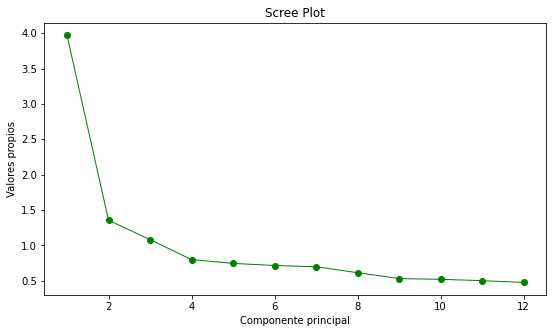

In [ ]:
values = np.arange(1,13)
eigenvalues = pd.DataFrame(data=fa.get_eigenvalues())
plt.figure(figsize=(9,5))
plt.plot(values, eigenvalues.loc[0], 'o-', linewidth=1, color='green')
plt.title('Scree Plot')
plt.xlabel('Componente principal')
plt.ylabel('Valores propios')

plt.show()

En este caso despues del cuarto factor la contribución relativa disminuye drásticamente. Pero de forma óptima se determinaron solo 3 factores.

Se agrega matriz de varianza y covarianza. Donde el primer array corresponde a la varianza de forma cruda, luego se agrega un array de proporción explicada de cada factor y un tercer array que corresponde a la proporción acumulada de cada factor. 

In [ ]:
fa.get_factor_variance()

(array([1.76688183, 1.60972876, 1.29341229]),
 array([0.14724015, 0.13414406, 0.10778436]),
 array([0.14724015, 0.28138422, 0.38916857]))

Se agrega además el análisis factorial exploratorio usando semopy. Este análisis da una idea del posible modelo. Es necesario notar que se repiten variables entre los factores, pero solo porque tienen alguna implicancia, y son significativas, con p=0,05. 


In [ ]:
print(semopy.efa.explore_cfa_model(junaeb3, pval=0.05))

eta1 =~ sk11 + sk9 + sk10 + sk12
eta2 =~ sk4 + sk2 + sk11 + sk3 + sk5 + sk1 + sk9 + sk6 + sk12
eta3 =~ sk11 + sk12 + sk13 + sk6
eta4 =~ sk5 + sk8 + sk9 + sk6




**Pregunta 5**
 Con los resultados obtenidos en la Pregunta 4, proponga un CFA donde cada variable solo se asocia con un factor. Entregue un nombre a cada factor que representa el concepto comun entre todas las variables. Reporte la importancia de cada medida (variable) a cada factor e indique la correlacion entre factores.



Se utiliza el mismo dataframe juneb3. Utilizando el modelo obtenido anteriormente.

eta1 =~ sk9 + sk10 + sk11 + sk12 + sk13

eta2 =~ sk1 + sk2 + sk3 +sk4

eta3 =~ sk5 + sk6 + sk8

Si recurrimos a la definición de cada una de las variables o preguntas podemos notar que las variables sk9 a sk13 corresponden a preguntas a adultos, intereses, y expresiones artisticas en general. Por ende se define el primer factor como Intereres Personales. El segundo factor se define en base a las variables sk1 a sk4, las cuales representan la expresion de afectividad de una persona, por ende el segundo factor se le denomina afectividad. El tercer factor está relacionado con el grado de socialización de una persona, por ende el tercer factor le llamaremos socialización. 

In [ ]:
Xf=junaeb3

mod = """
# measurement model
Intereses_Personales =~ sk9 + sk10 + sk11 + sk12 + sk13
Afectividad =~ sk1 + sk2 + sk3 +sk4
Socialización =~ sk5 + sk6 + sk8
"""

model = semopy.Model(mod)
out=model.fit(Xf)
print(out)

Name of objective: MLW
Optimization method: SLSQP
Optimization successful.
Optimization terminated successfully
Objective value: 0.140
Number of iterations: 43
Params: 1.370 1.252 1.124 1.322 1.913 1.643 1.800 1.019 1.145 0.203 0.433 0.197 0.241 0.277 0.151 0.477 0.092 0.367 0.161 0.700 0.596 0.160 0.047 0.049 0.057 0.145 0.088


Se obtiene un modelo mediante la función maxima verosimilitud ponderada. El valor óptimo de la función es de 0,140. Se realizaron 43 iteraciones. Luego se entregan los parámetros que para cada factor hay un parámetro estimado. 

Se analiza la importancia de cada medida a los factores correspondientes. Para ello se normaliza uno de los pesos relativos en este caso sk9 (su peso es 1) para el primer factor. Luego cada una de las demás variables tendrá un grado de importancia para el factor relativa a sk9. En este caso la variable que presenta una mayor importancia es sk10. Para el segundo factor la variable que se normalizó es sk1, donde la variable de mayor importancia es sk2. Y para el tercer factor la variable que se normalizó es sk5, y la variable con mayor importancia es sk8. 



Luego se entrega la correlación entre los factores, en esta caso entre el factor socialización	e intereses personales es de 0.580060. Luego entre socialización y afectividad	es de 0.652928. Finalmente entre intereses personales y afectividad es de 0.591167. Notar que en los tres casos es bajísima esta correlación. 

In [ ]:
model.inspect(mode='list', what="names", std_est=True)

,lval,op,rval,Estimate,Est. Std,Std. Err,z-value,p-value
0,sk9,~,Intereses_Personales,1.000000,0.585656,-,-,-
1,sk10,~,Intereses_Personales,1.370172,0.559402,0.013871,98.782266,0.0
2,sk11,~,Intereses_Personales,1.251958,0.726183,0.010954,114.293269,0.0
3,sk12,~,Intereses_Personales,1.124168,0.544700,0.011593,96.968045,0.0
4,sk13,~,Intereses_Personales,1.321629,0.515012,0.014189,93.141585,0.0
5,sk1,~,Afectividad,1.000000,0.583347,-,-,-
6,sk2,~,Afectividad,1.913176,0.646890,0.017591,108.755881,0.0
7,sk3,~,Afectividad,1.643261,0.627762,0.01538,106.841209,0.0
8,sk4,~,Afectividad,1.800482,0.698943,0.015901,113.230677,0.0
9,sk5,~,Socialización,1.000000,0.717447,-,-,-


Luego se entregan las principales estadísticas del modelo, donde encontramos RMSEA que es un índice de ajuste que funciona correctamente independientemente del número de factores. Notamos que el valor es cercano a 0,05 por lo que se considera que el modelo se ajusta de forma adecuada a la muestra. 


In [ ]:
a=semopy.calc_stats(model)

In [ ]:
print(a)

       DoF  DoF Baseline         chi2  chi2 p-value  chi2 Baseline       CFI  \
Value   51            66  7969.115166           0.0  151689.610826  0.947778   

            GFI      AGFI       NFI       TLI     RMSEA        AIC  \
Value  0.947464  0.932013  0.947464  0.932418  0.052256  53.719679   

              BIC    LogLik  
Value  295.323633  0.140161  


Finalmente se presenta de forma gráfica cada uno de los factores y las variables que representan a cada factor. 

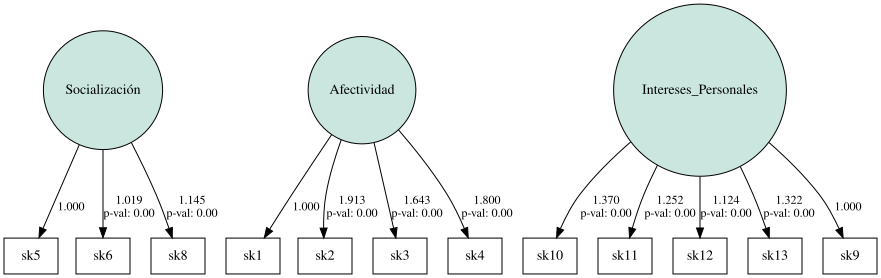

In [ ]:
semopy.semplot(model, "model.png")

**Pregunta 6**
Finalmente, implemente un SEM completo usando la estructura propuesta en la Pregunta 5. En particular, estime un modelo donde los factores explican el nivel de actividad fisica, junto con otras variables que existen en la base de datos. Ademas utilice otras variables relevantes de la base de datos para explicar los factores latentes. Las variables a incluir en el modelo final deben tener sustento teorico y el modelo final debe optimizar el ajuste a los datos, en base a los criterios vistos en clase. Que puede concluir en base a sus resultados?

In [ ]:
junaeb4.head(3)

,sexo,edad,imce,vive_padre,vive_madre,sk1,sk2,sk3,sk4,sk5,...,sk9,sk10,sk11,sk12,sk13,act_fisica,area,educm,educp,madre_work
1,1,84,2.05,1,1,1,1,1,1,1,...,1,1,1,1,1,2.0,1,16.0,12,-1
2,0,86,1.05,1,1,1,1,1,1,1,...,1,1,1,1,1,1.0,1,17.0,15,0
4,1,91,2.75,1,1,1,1,1,2,2,...,3,3,3,2,2,2.0,1,20.0,19,1


Para la implementación del SEM completo se utilizará la data junaeb4. En primer lugar es necesario recordar la estructura obtenida anteriormente. 

Intereses_Personales =~ sk9 + sk10 + sk11 + sk12 + sk13

Afectividad =~ sk1 + sk2 + sk3 +sk4

Socialización =~ sk5 + sk6 + sk8

Para la parte estructural del modelo de ecuaciones estructurales, se analizaron los factores y se estableció una dependencia entre la afecttividad respecto a la socialización y los intereses personales. Además se estableció una dependencia entre la socialización respecto a los intereses personales. 



In [ ]:
import semopy
import pandas as pd
Xf=junaeb4

mod1 = """
# measurement model
Intereses_Personales =~ sk9 + sk10 + sk11 + sk12 + sk13
Afectividad =~ sk1 + sk2 + sk3 +sk4 
Socialización =~ sk5 + sk6 + sk8

# regressions
Afectividad ~ Socialización + Intereses_Personales
Socialización ~ Intereses_Personales
act_fisica ~ Intereses_Personales + Afectividad + Socialización 
"""

model1= semopy.Model(mod1)
out=model1.fit(Xf)
print(out)

Name of objective: MLW
Optimization method: SLSQP
Optimization successful.
Optimization terminated successfully
Objective value: 0.150
Number of iterations: 46
Params: 1.370 1.251 1.126 1.323 1.914 1.644 1.801 1.018 1.171 0.256 0.183 0.609 -0.218 0.449 -0.543 0.104 0.433 0.277 0.153 0.092 0.370 0.596 0.203 1.098 0.699 0.241 0.197 0.024 0.471 0.161 0.145


Dada la optimización del modelo se obtuvo que un valor objetivo de 0.152 en 46 iteraciones. 

Posteriormente se determinó que para el factor afectividad  habían otras variables que lo explicaban. Estas variables son vive_padre, vive_madre y madre_work. Para el caso de la variable actividad física, existían variables que la explicaban tales como el imce y el sexo. 

Con estas suposiciones se estableció el modelo. Se realizó la optimización mediante semopy y se registran a continuación los resultados. 

In [ ]:
import semopy
import pandas as pd
Xf=junaeb4

mod = """
# measurement model
Intereses_Personales =~ sk9 + sk10 + sk11 + sk12 + sk13
Afectividad =~ sk1 + sk2 + sk3 +sk4 + vive_padre + vive_madre + madre_work
Socialización =~ sk5 + sk6 + sk8

# regressions
Afectividad ~ Socialización + Intereses_Personales
Socialización ~ Intereses_Personales
act_fisica ~ Intereses_Personales + Afectividad + Socialización + imce + sexo
"""

model= semopy.Model(mod)
out=model.fit(Xf)
print(out)

Name of objective: MLW
Optimization method: SLSQP
Optimization successful.
Optimization terminated successfully
Objective value: 0.306
Number of iterations: 50
Params: 1.371 1.251 1.125 1.325 1.914 1.643 1.798 -0.077 -0.026 -0.165 1.018 1.170 0.256 0.183 0.609 -0.251 0.439 -0.528 -0.016 0.138 0.024 0.884 0.104 0.433 0.277 0.153 0.092 0.370 0.596 0.204 1.093 0.698 0.241 0.197 0.024 0.471 0.161 0.201 0.145


In [ ]:
res = model.fit(Xf)

Se obtiene un resumen del modelo producido. En este caso los coeficientes representan un cambio de una unidad de una variable estandarizada a otra unidad de una variable estandarizada. Notar que en la matriz de varianza y covarianza se obtuvieron estimadores para cada una de las variables que tienen valor distinto de cero. Además dados los valores p que son menores a 0,05 para cada uno de los casos del modelo por ende las variables son significativas.  
Además se obtuvo una mejor significativa en el valor objetivo pasando de 0.152 a 0.306. 


In [ ]:
model.inspect(mode='list', what="names", std_est=True)

,lval,op,rval,Estimate,Est. Std,Std. Err,z-value,p-value
0,Afectividad,~,Socialización,0.255940,0.466923,0.004676,54.735728,0.0
1,Afectividad,~,Intereses_Personales,0.183384,0.320015,0.004356,42.095012,0.0
2,Socialización,~,Intereses_Personales,0.609153,0.582678,0.007423,82.06653,0.0
3,sk9,~,Intereses_Personales,1.000000,0.585397,-,-,-
4,sk10,~,Intereses_Personales,1.370578,0.559402,0.013867,98.837299,0.0
5,sk11,~,Intereses_Personales,1.250849,0.725362,0.010937,114.368228,0.0
6,sk12,~,Intereses_Personales,1.125490,0.545147,0.011594,97.077049,0.0
7,sk13,~,Intereses_Personales,1.324703,0.516196,0.014191,93.347428,0.0
8,sk1,~,Afectividad,1.000000,0.583514,-,-,-
9,sk2,~,Afectividad,1.913588,0.647066,0.017587,108.807947,0.0


In [ ]:
b=semopy.calc_stats(model)
print(b)

       DoF  DoF Baseline         chi2  chi2 p-value  chi2 Baseline      CFI  \
Value  132           155  17420.41143           0.0  163330.515895  0.89405   

            GFI      AGFI       NFI       TLI     RMSEA       AIC        BIC  \
Value  0.893343  0.874758  0.893343  0.875589  0.047996  77.38722  426.37071   

        LogLik  
Value  0.30639  


 Se analizan estadísticas del modelo. El RMSEA dado es inferior a 0.05 por lo que se considera que el modelo se ajusta de forma adecuada a la muestra. El CFI debe estar en torno a 0.95 para
considerar que el modelo se ajusta adecuadamente a
los datos, en este caso es 0.89 lo que es bastante cercano. Para el caso de GFI (Goodness of Fit Index), debe ser igual a superior a 0.9 y en este caso da como resultado 0.89. 
En general se puede concluir que el modelo se ajusta de forma adecuada a los datos, ya que a pesar de no tener estadísticas de forma óptima son bastante cercanas. Además las suposiciones realizadas en un comienzo respecto a la explicación de los factores y variables se cumplieron según los resultados del resumen del modelo. 

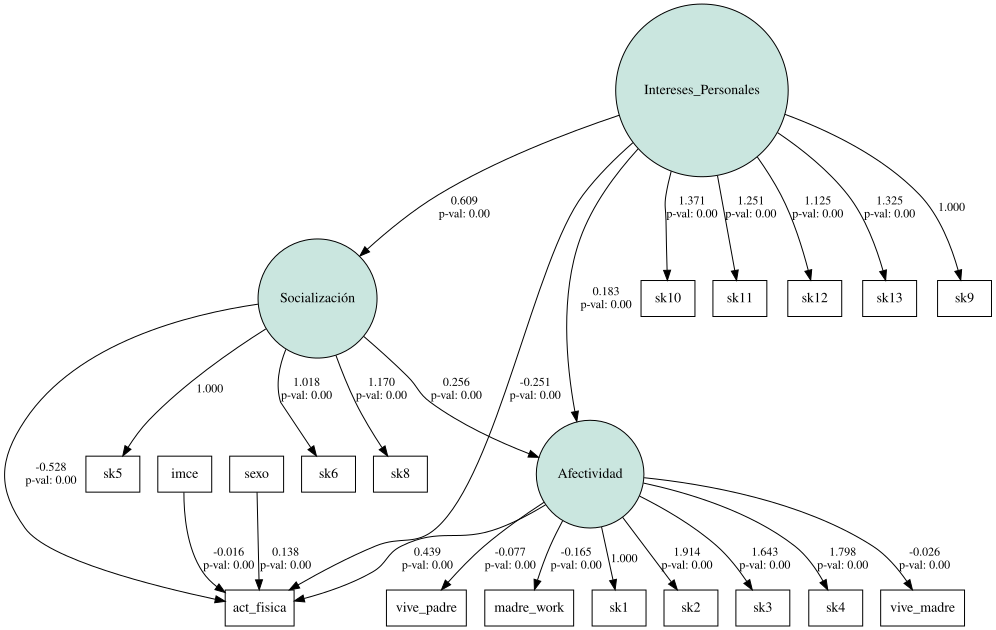

In [ ]:
semopy.semplot(model, "semmodel.png")

**Anexos**

**Anexo 1: Distribuciones de variables**


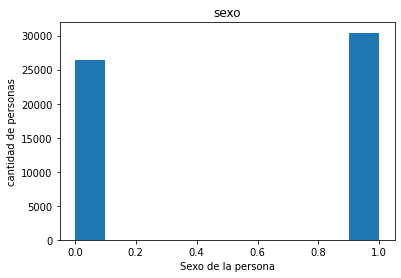

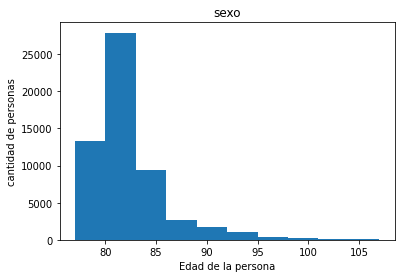

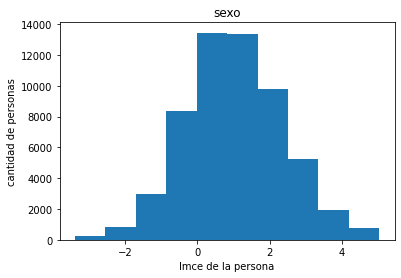

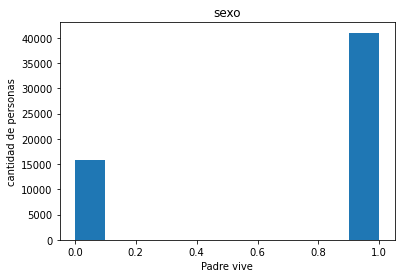

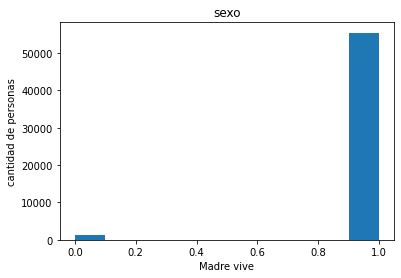

...

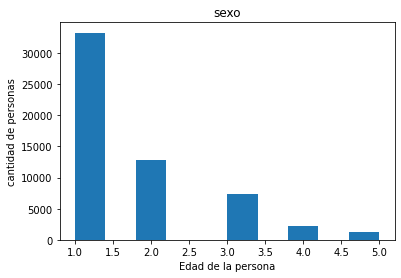

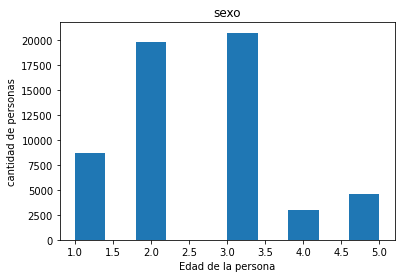

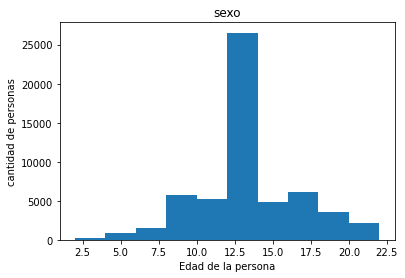

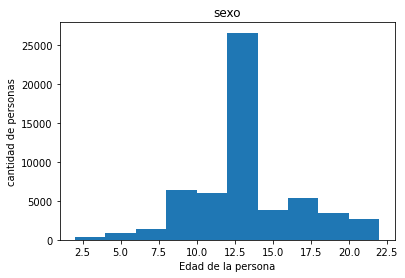

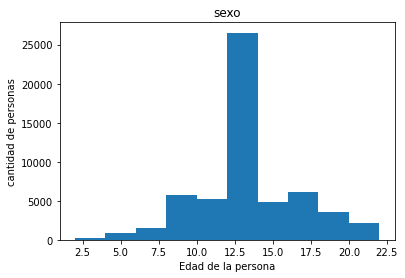

In [ ]:
plt.hist(junaeb2.sexo)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Sexo de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.edad)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.imce)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Imce de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.vive_padre)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Padre vive')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.vive_madre)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Madre vive')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.area)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Area donde vive')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk1)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Muestra afecto a padres')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk2)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk3)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk4)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk5)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk6)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk7)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk9)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk10)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk11)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk12)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.sk13)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.act_fisica)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.educm)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.educp)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()
plt.hist(junaeb2.educm)
plt.title(junaeb2.columns.values[0])
plt.xlabel('Edad de la persona')
plt.ylabel('cantidad de personas')
plt.show()

**Anexo 2: Outliers**

In [ ]:
import plotly.express as px
fig1 = px.histogram(junaeb2, x="sexo", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig1.show()
fig2 = px.histogram(junaeb2, x="edad", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig2.show()
fig3 = px.histogram(junaeb2, x="imce", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig3.show()
fig4 = px.histogram(junaeb2, x="vive_padre", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig4.show()
fig5 = px.histogram(junaeb2, x="vive_madre", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig5.show()
fig6 = px.histogram(junaeb2, x="sk1", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig6.show()
fig7 = px.histogram(junaeb2, x="sk2", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig7.show()
fig8 = px.histogram(junaeb2, x="sk3", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig8.show()
fig9 = px.histogram(junaeb2, x="sk4", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig9.show()
fig10 = px.histogram(junaeb2, x="sk5", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig10.show()
fig11= px.histogram(junaeb2, x="sk6", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig11.show()
fig12 = px.histogram(junaeb2, x="sk7", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig12.show()
fig13 = px.histogram(junaeb2, x="sk8", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig13.show()
fig14 = px.histogram(junaeb2, x="sk9", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig14.show()
fig15 = px.histogram(junaeb2, x="sk10", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig15.show()
fig16 = px.histogram(junaeb2, x="sk11", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig16.show()
fig17 = px.histogram(junaeb2, x="sk12", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig17.show()
fig18 = px.histogram(junaeb2, x="sk13", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig18.show()
fig19 = px.histogram(junaeb2, x="act_fisica", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig19.show()
fig20 = px.histogram(junaeb2, x="area", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig20.show()
fig21 = px.histogram(junaeb2, x="educm", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig21.show()
fig22 = px.histogram(junaeb2, x="educp", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig22.show()
fig23 = px.histogram(junaeb2, x="madre_work", marginal="box",color_discrete_sequence=['green'],height=500,width=700)
fig23.show()